## ANÁLISE DE RISCO DE EMPRÉSTIMO

### Projeto Final de Big Data - Processamento e Análise dos dados.

##### Integrantes:
Adriano Rossete, João Machado, Juliana Suzuki, Leandro Gimenez e Oscar Babilonia

In [2]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from pyspark.sql.functions import udf
from pyspark.sql.functions import mean as _mean, stddev as _stddev, col, date_format
from pyspark.sql.types import StringType
from pyspark.sql.types import DoubleType
from pyspark.sql import functions as f
import pyspark.sql.functions as spf
from collections import Counter
from collections import OrderedDict
from plotly import tools
import plotly.plotly as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import time
init_notebook_mode(connected=True)

In [3]:
# File location and type
file_location = "/FileStore/tables/loan.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .option('escape','"') \
  .load(file_location)

#original_df = df

In [4]:
display(df)

id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
1077501,1296599,5000.0,5000.0,4975.0,36 months,10.65,162.87,B,B2,null,10+ years,RENT,24000.0,Verified,Dec-2011,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail.action?loan_id=1077501,Borrower added on 12/22/11 > I need to upgrade my business technologies.,credit_card,Computer,860xx,AZ,27.65,0.0,Jan-1985,1.0,null,null,3.0,0.0,13648.0,83.7,9.0,f,0.0,0.0,5861.07141425,5831.78,5000.0,861.07,0.0,0.0,0.0,Jan-2015,171.62,null,Jan-2016,0.0,null,1.0,INDIVIDUAL,null,null,null,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
1077430,1314167,2500.0,2500.0,2500.0,60 months,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-2011,Charged Off,n,https://www.lendingclub.com/browse/loanDetail.action?loan_id=1077430,Borrower added on 12/22/11 > I plan to use this money to finance the motorcycle i am looking at. I plan to have it paid off as soon as possible/when i sell my old bike. I only need this money because the deal im looking at is to good to pass up. Borrower added on 12/22/11 > I plan to use this money to finance the motorcycle i am looking at. I plan to have it paid off as soon as possible/when i sell my old bike.I only need this money because the deal im looking at is to good to pass up. I have finished college with an associates degree in business and its takingmeplaces,car,bike,309xx,GA,1.0,0.0,Apr-1999,5.0,null,null,3.0,0.0,1687.0,9.4,4.0,f,0.0,0.0,1008.71,1008.71,456.46,435.17,0.0,117.08,1.11,Apr-2013,119.66,null,Sep-2013,0.0,null,1.0,INDIVIDUAL,null,null,null,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
1077175,1313524,2400.0,2400.0,2400.0,36 months,15.96,84.33,C,C5,null,10+ years,RENT,12252.0,Not Verified,Dec-2011,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail.action?loan_id=1077175,null,small_business,real estate business,606xx,IL,8.72,0.0,Nov-2001,2.0,null,null,2.0,0.0,2956.0,98.5,10.0,f,0.0,0.0,3003.65364445,3003.65,2400.0,603.65,0.0,0.0,0.0,Jun-2014,649.91,null,Jan-2016,0.0,null,1.0,INDIVIDUAL,null,null,null,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
1076863,1277178,10000.0,10000.0,10000.0,36 months,13.49,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-2011,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail.action?loan_id=1076863,"Borrower added on 12/21/11 > to pay for property tax (borrow from friend, need to pay back) & central A/C need to be replace. I'm very sorry to let my loan expired last time.",other,personel,917xx,CA,20.0,0.0,Feb-1996,1.0,35.0,null,10.0,0.0,5598.0,21.0,37.0,f,0.0,0.0,12226.3022123,12226.3,10000.0,2209.33,16.97,0.0,0.0,Jan-2015,357.48,null,Jan-2015,0.0,null,1.0,INDIVIDUAL,null,null,null,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
1075358,1311748,3000.0,3000.0,3000.0,60 months,12.69,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,Source Verified,Dec-2011,Current,n,https://www.lendingclub.com/browse/loanDetail.action?loan_

In [5]:
display(df.describe())

summary,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
count,887379,887379,887379,887379,887379,887379,887379,887379,887379,887379,835922,887379,887379,887375,887379,887379,887379,887379,887379,126029,887379,887228,887379,887379,887379,887350,887350,887350,433067,137053,887350,887350,887379,886877,887350,887379,887379,887379,887379,887379,887379,887379,887379,887379,887379,869720,887379,634408,887326,887234,221703,887379,887379,511,509,511,887350,817103,817103,21372,21372,21372,21372,20810,21372,18617,21372,21372,21372,21372,817103,21372,21372,21372
mean,3.246513305502384E7,3.500182481556246E7,14755.26460508982,14741.877625005776,14702.46438322972,null,13.246739679436203,436.71712736044094,null,null,1.2810941556818182E7,null,null,75027.58776076633,null,null,null,null,null,null,null,Infinity,null,null,18.157038739929543,0.31444187750042263,null,0.694623316616893,34.06379844227337,70.1179032928867,11.548469037020341,0.19530737589451738,16920.78753272277,55.06769323141798,25.26802614526399,null,8403.124851906754,8399.713242132362,7558.82668364332,7521.160306148809,5757.706423625079,1754.8043266405873,0.39669179127960713,45.91924337060411,4.88075737886564,null,2164.1455854582186,null,null,0.014379521073358326,44.10483845505023,1.0,null,109981.0115851272,18.310117878192536,null,0.004991266129486673,225.70261031962923,139458.18933598333,1.1090211491671347,2.928832116788321,0.7616507580011229,1.674574209245742,20.91268620855358,36552.811388732924,71.53531718321945,1.389060452929066,2.9754819389855887,5887.979739846528,60.83193898558846,32068.620045453266,0.9439453490548381,1.5370578326782707,1.9773067565038367
stddev,2.2827341721265975E7,2.4113354675557025E7,8435.455601278412,8429.897656714647,8442.106731567988,null,4.381867414712412,244.1865934763983,null,null,8.34575692812245E7,null,null,64698.300142406704,null,null,null,null,null,null,null,NaN,null,null,17.19062568794122,0.8622438402021205,null,0.9984476849665133,21.884940226394217,28.127913567245912,5.3173131245056195,0.5820906692597618,22426.791895963033,23.834344103381603,11.840561062535398,null,8493.450268733657,8489.997616504212,7871.243335695969,7846.108603577967,6625.441045702605,2095.3560992364482,4.087825339059571,409.693873633236,63.12528090850072,null,4794.78323290594,null,null,0.134190757565532,22.17984069157954,2.5997242370116345E-17,null,52730.37984721526,7.169233422067739,null,0.07762534479480568,10311.367195429997,153749.96688525318,1.2426750562103301,3.0899871930168317,0.9960346479644229,1.6887251954651177,27.209081261092834,43103.83361919364,23.022861656172903,1.5201293497879675,2.6318859876071805,5284.701239120258,20.01325357315804,37498.25832581597,1.4468715236471816,2.723339165544767,2.8740666204185157
min,54734,70473,500.0,500.0,0.0,36 months,5.32,15.67,A,A1,Adv Mtr Proj Fld Rep,1 year,ANY,0.0,Not Verified,Apr-2008,Charged Off,n,https://www.lendingclub.com/browse/loanDetail.action?loan_id=1000007,"Loan for purchase of grand piano. Piano will further diversify an already profitable business. Monthly budget very high via three stable business, longest in business 10+ years",c

In [6]:
df.printSchema()


root
-- id: integer (nullable = true)
-- member_id: integer (nullable = true)
-- loan_amnt: double (nullable = true)
-- funded_amnt: double (nullable = true)
-- funded_amnt_inv: double (nullable = true)
-- term: string (nullable = true)
-- int_rate: double (nullable = true)
-- installment: double (nullable = true)
-- grade: string (nullable = true)
-- sub_grade: string (nullable = true)
-- emp_title: string (nullable = true)
-- emp_length: string (nullable = true)
-- home_ownership: string (nullable = true)
-- annual_inc: double (nullable = true)
-- verification_status: string (nullable = true)
-- issue_d: string (nullable = true)
-- loan_status: string (nullable = true)
-- pymnt_plan: string (nullable = true)
-- url: string (nullable = true)
-- desc: string (nullable = true)
-- purpose: string (nullable = true)
-- title: string (nullable = true)
-- zip_code: string (nullable = true)
-- addr_state: string (nullable = true)
-- dti: double (nullable = true)
-- delinq_2yrs: double (nullable = true)
-- earliest_cr_line: string (nullable = true)
-- inq_last_6mths: double (nullable = true)
-- mths_since_last_delinq: double (nullable = true)
-- mths_since_last_record: double (nullable = true)
-- open_acc: double (nullable = true)
-- pub_rec: double (nullable = true)
-- revol_bal: double (nullable = true)
-- revol_util: double (nullable = true)
-- total_acc: double (nullable = true)
-- initial_list_status: string (nullable = true)
-- out_prncp: double (nullable = true)
-- out_prncp_inv: double (nullable = true)
-- total_pymnt: double (nullable = true)
-- total_pymnt_inv: double (nullable = true)
-- total_rec_prncp: double (nullable = true)
-- total_rec_int: double (nullable = true)
-- total_rec_late_fee: double (nullable = true)
-- recoveries: double (nullable = true)
-- collection_recovery_fee: double (nullable = true)
-- last_pymnt_d: string (nullable = true)
-- last_pymnt_amnt: double (nullable = true)
-- next_pymnt_d: string (nullable = true)
-- last_credit_pull_d: string (nullable = true)
-- collections_12_mths_ex_med: double (nullable = true)
-- mths_since_last_major_derog: double (nullable = true)
-- policy_code: double (nullable = true)
-- application_type: string (nullable = true)
-- annual_inc_joint: double (nullable = true)
-- dti_joint: double (nullable = true)
-- verification_status_joint: string (nullable = true)
-- acc_now_delinq: double (nullable = true)
-- tot_coll_amt: double (nullable = true)
-- tot_cur_bal: double (nullable = true)
-- open_acc_6m: double (nullable = true)
-- open_il_6m: double (nullable = true)
-- open_il_12m: double (nullable = true)
-- open_il_24m: double (nullable = true)
-- mths_since_rcnt_il: double (nullable = true)
-- total_bal_il: double (nullable = true)
-- il_util: double (nullable = true)
-- open_rv_12m: double (nullable = true)
-- open_rv_24m: double (nullable = true)
-- max_bal_bc: double (nullable = true)
-- all_util: double (nullable = true)
-- total_rev_hi_lim: double (nullable = true)
-- inq_fi: double (nullable = true)
-- total_cu_tl: double (nullable = true)
-- inq_last_12m: double (nullable = true)

In [7]:
df = df.withColumn('issue_datetime', f.from_unixtime(f.unix_timestamp('issue_d', 'MMM-yyyy')))

In [8]:
df = df.withColumn('issue_datemonth', date_format('issue_datetime', 'yyyy-MM'))

In [9]:
display(df)

id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,issue_datetime,issue_datemonth
1077501,1296599,5000.0,5000.0,4975.0,36 months,10.65,162.87,B,B2,null,10+ years,RENT,24000.0,Verified,Dec-2011,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail.action?loan_id=1077501,Borrower added on 12/22/11 > I need to upgrade my business technologies.,credit_card,Computer,860xx,AZ,27.65,0.0,Jan-1985,1.0,null,null,3.0,0.0,13648.0,83.7,9.0,f,0.0,0.0,5861.07141425,5831.78,5000.0,861.07,0.0,0.0,0.0,Jan-2015,171.62,null,Jan-2016,0.0,null,1.0,INDIVIDUAL,null,null,null,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2011-12-01 00:00:00,2011-12
1077430,1314167,2500.0,2500.0,2500.0,60 months,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-2011,Charged Off,n,https://www.lendingclub.com/browse/loanDetail.action?loan_id=1077430,Borrower added on 12/22/11 > I plan to use this money to finance the motorcycle i am looking at. I plan to have it paid off as soon as possible/when i sell my old bike. I only need this money because the deal im looking at is to good to pass up. Borrower added on 12/22/11 > I plan to use this money to finance the motorcycle i am looking at. I plan to have it paid off as soon as possible/when i sell my old bike.I only need this money because the deal im looking at is to good to pass up. I have finished college with an associates degree in business and its takingmeplaces,car,bike,309xx,GA,1.0,0.0,Apr-1999,5.0,null,null,3.0,0.0,1687.0,9.4,4.0,f,0.0,0.0,1008.71,1008.71,456.46,435.17,0.0,117.08,1.11,Apr-2013,119.66,null,Sep-2013,0.0,null,1.0,INDIVIDUAL,null,null,null,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2011-12-01 00:00:00,2011-12
1077175,1313524,2400.0,2400.0,2400.0,36 months,15.96,84.33,C,C5,null,10+ years,RENT,12252.0,Not Verified,Dec-2011,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail.action?loan_id=1077175,null,small_business,real estate business,606xx,IL,8.72,0.0,Nov-2001,2.0,null,null,2.0,0.0,2956.0,98.5,10.0,f,0.0,0.0,3003.65364445,3003.65,2400.0,603.65,0.0,0.0,0.0,Jun-2014,649.91,null,Jan-2016,0.0,null,1.0,INDIVIDUAL,null,null,null,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2011-12-01 00:00:00,2011-12
1076863,1277178,10000.0,10000.0,10000.0,36 months,13.49,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-2011,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail.action?loan_id=1076863,"Borrower added on 12/21/11 > to pay for property tax (borrow from friend, need to pay back) & central A/C need to be replace. I'm very sorry to let my loan expired last time.",other,personel,917xx,CA,20.0,0.0,Feb-1996,1.0,35.0,null,10.0,0.0,5598.0,21.0,37.0,f,0.0,0.0,12226.3022123,12226.3,10000.0,2209.33,16.97,0.0,0.0,Jan-2015,357.48,null,Jan-2015,0.0,null,1.0,INDIVIDUAL,null,null,null,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2011-12-01 00:00:00,2011-12
1075358,1311748,3000.0,3000.0,3000.0,60 months,12.69,67.79,

In [10]:
# Create a view or table
temp_table_name = "loan_csv"
df.createOrReplaceTempView(temp_table_name)


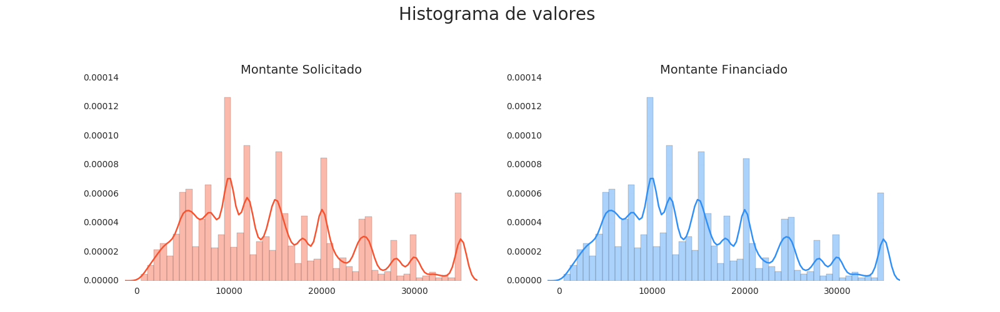

In [11]:
fig, ax = plt.subplots(1, 2, figsize=(16,5))
plt.suptitle("Histograma de valores ",fontsize=20)
plt.subplots_adjust(top=0.75)
loan_amount = df.select('loan_amnt').collect()
funded_amount = df.select("funded_amnt").collect()
#investor_funds = df.select("funded_amnt_inv").collect()

ax[0].set_title("Montante Solicitado", fontsize=14)
ax[0].set(xticks=[0,10000,20000,30000])
sns.distplot(loan_amount, ax=ax[0], color="#F7522F")

ax[1].set_title("Montante Financiado", fontsize=14)
ax[1].set(xticks=[0,10000,20000,30000])
sns.distplot(funded_amount, ax=ax[1], color="#2F8FF7")

#ax[2].set_title("Total committed by Investors", fontsize=14)
#ax[2].set(xticks=[0,10000,20000,30000], xticklabels=["0","10000","20000","30000"])
#sns.distplot(investor_funds, ax=ax[2], color="#2EAD46")

display(fig)

In [12]:
from pyspark.sql.functions import split
split_col = split(df['issue_d'], '-')
df = df.withColumn('month', split_col.getItem(0))
df = df.withColumn('year', split_col.getItem(1).cast("int"))

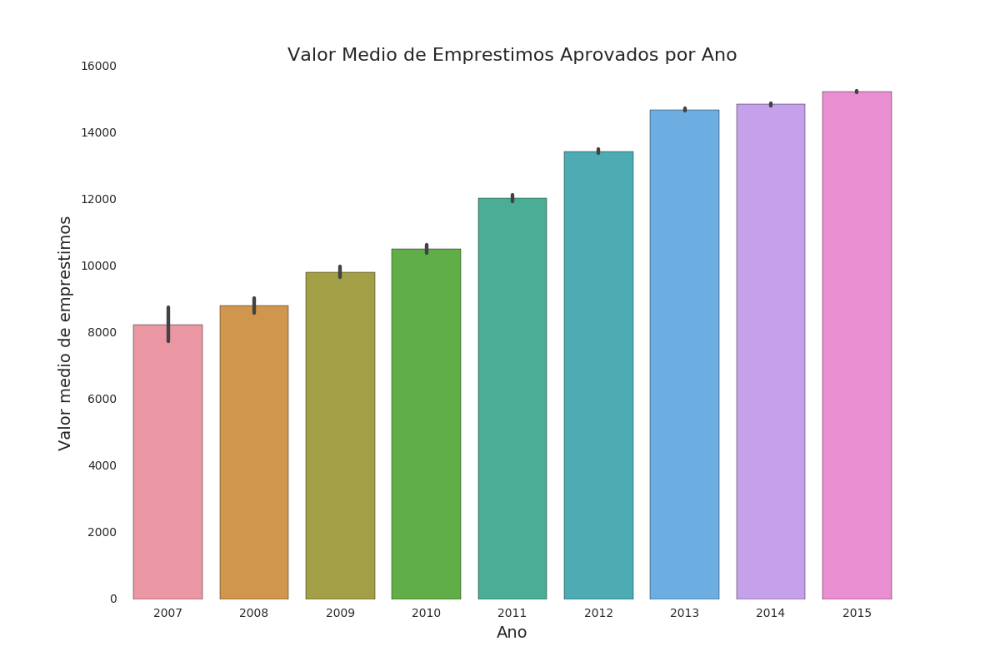

In [13]:
fig = plt.figure(figsize=(12,8))
sns.barplot('year', 'loan_amnt', data=df.select('loan_amnt','year').toPandas())
plt.title('Valor Medio de Emprestimos Aprovados por Ano', fontsize=16)
plt.xlabel('Ano', fontsize=14)
plt.ylabel('Valor medio de emprestimos', fontsize=14)

display(fig)

In [14]:
from pyspark.sql.functions import *
df_purpose = df.groupby("purpose").agg(sum("loan_amnt"),count("id"))
df_purpose.show()

+------------------+--------------+---------+
 purpose|sum(loan_amnt)|count(id)|
+------------------+--------------+---------+
 wedding| 2.4569875E7| 2347|
 educational| 2798600.0| 423|
 other| 4.24194075E8| 42894|
 small_business| 1.600178E8| 10377|
debt_consolidation| 8.087850375E9| 524215|
 credit_card| 3.162591325E9| 206182|
 moving| 4.2724975E7| 5414|
 vacation| 2.978725E7| 4736|
 renewable_energy| 5720275.0| 575|
 house| 5.4856575E7| 3707|
 car| 7.8725E7| 8863|
 major_purchase| 2.00413275E8| 17277|
 medical| 7.702285E7| 8540|
 home_improvement| 7.422397E8| 51829|
+------------------+--------------+---------+

In [15]:
df_purpose.select('purpose', 'sum(loan_amnt)').toPandas().head(10)

Out[ 95 ]: 
 purpose sum(loan_amnt)
0 wedding 2.456988e+07
1 educational 2.798600e+06
2 other 4.241941e+08
3 small_business 1.600178e+08
4 debt_consolidation 8.087850e+09
5 credit_card 3.162591e+09
6 moving 4.272498e+07
7 vacation 2.978725e+07
8 renewable_energy 5.720275e+06
9 house 5.485658e+07

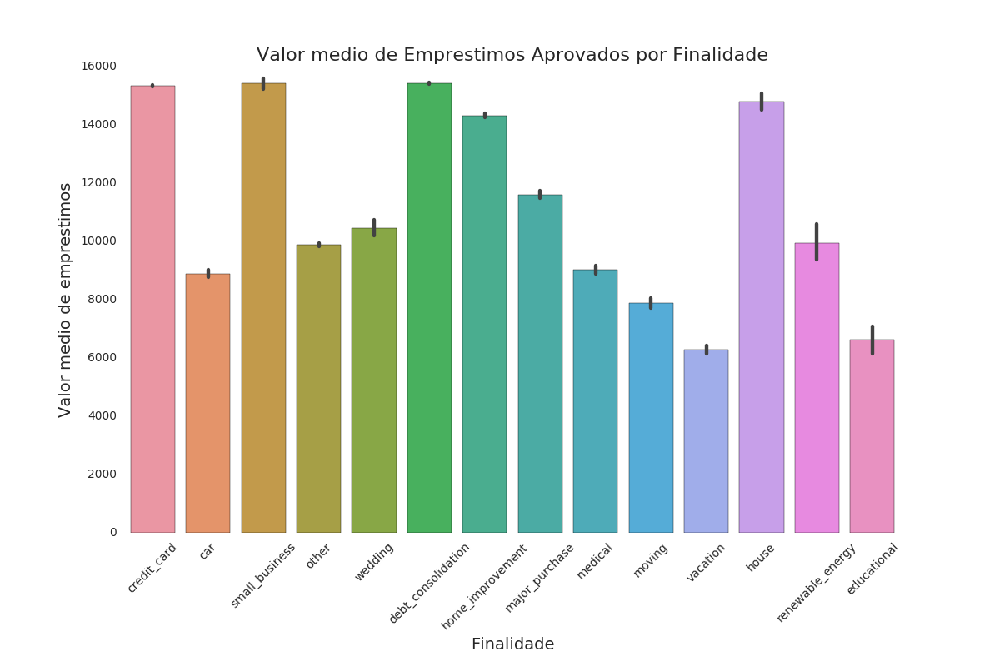

In [16]:
fig = plt.figure(figsize=(12,8))
sns.barplot('purpose', 'loan_amnt', data=df.select('purpose','loan_amnt').toPandas())
plt.title('Valor medio de Emprestimos Aprovados por Finalidade', fontsize=16)
plt.xlabel('Finalidade', fontsize=14)
plt.ylabel('Valor medio de emprestimos', fontsize=14)
#plt.xticks(rotation='vertical')
plt.xticks(rotation=45)
plt.subplots_adjust(bottom=0.2) 
                        
                    
display(fig)

In [17]:
df_purpose.select('purpose', spf.col('sum(loan_amnt)')/100000, 'count(id)').show()

+------------------+-------------------------+---------+
 purpose|(sum(loan_amnt) / 100000)|count(id)|
+------------------+-------------------------+---------+
 wedding| 245.69875| 2347|
 educational| 27.986| 423|
 other| 4241.94075| 42894|
 small_business| 1600.178| 10377|
debt_consolidation| 80878.50375| 524215|
 credit_card| 31625.91325| 206182|
 moving| 427.24975| 5414|
 vacation| 297.8725| 4736|
 renewable_energy| 57.20275| 575|
 house| 548.56575| 3707|
 car| 787.25| 8863|
 major_purchase| 2004.13275| 17277|
 medical| 770.2285| 8540|
 home_improvement| 7422.397| 51829|
+------------------+-------------------------+---------+

In [18]:
%sql select loan_status, count(id) as TT from loan_csv group by loan_status order by 2 desc

loan_status,TT
Current,601779
Fully Paid,207723
Charged Off,45248
Late (31-120 days),11591
Issued,8460
In Grace Period,6253
Late (16-30 days),2357
Does not meet the credit policy. Status:Fully Paid,1988
Default,1219
Does not meet the credit policy. Status:Charged Off,761


In [19]:
west = ['CA', 'OR', 'UT','WA', 'CO', 'NV', 'AK', 'MT', 'HI', 'WY', 'ID']
south_west = ['AZ', 'TX', 'NM', 'OK']
south_east = ['GA', 'NC', 'VA', 'FL', 'KY', 'SC', 'LA', 'AL', 'WV', 'DC', 'AR', 'DE', 'MS', 'TN' ]
mid_west = ['IL', 'MO', 'MN', 'OH', 'WI', 'KS', 'MI', 'SD', 'IA', 'NE', 'IN', 'ND']
north_east = ['CT', 'NY', 'PA', 'NJ', 'RI','MA', 'MD', 'VT', 'NH', 'ME']

def finding_regions(state):
    if state in west:
        return 'West'
    elif state in south_west:
        return 'SouthWest'
    elif state in south_east:
        return 'SouthEast'
    elif state in mid_west:
        return 'MidWest'
    elif state in north_east:
        return 'NorthEast'
      
region_list_udf = udf(lambda x: finding_regions(x), StringType())
df = df.withColumn('region', region_list_udf('addr_state'))

bad_loan = ['Charged Off', 'Default', 'Does not meet the credit policy. Status:Charged Off', 'In Grace Period', 'Late (16-30 days)', 'Late (31-120 days)']
def loan_condition(status):
    if status in bad_loan:
        return 'Bad Loan'
    return 'Good Loan'

loan_condition_udf = udf(lambda x: loan_condition(x), StringType())
df = df.withColumn('loan_condition', loan_condition_udf('loan_status'))

def employment_length(emp_length):
  if emp_length == '10+ years':
    return 10.0
  elif emp_length == '9 years':
    return 9.0
  elif emp_length == '8 years':
    return 8.0
  elif emp_length == '7 years':
    return 7.0
  elif emp_length == '6 years':
    return 6.0
  elif emp_length == '5 years':
    return 5.0
  elif emp_length == '4 years':
    return 4.0
  elif emp_length == '3 years':
    return 3.0
  elif emp_length == '2 years':
    return 2.0
  elif emp_length == '1 year':
    return 1.0
  elif emp_length == '< 1 year':
    return 0.5
  return 0.0

employment_length_udf = udf(lambda x: employment_length(x), DoubleType())
df = df.withColumn('emp_length_int', employment_length_udf('emp_length'))

In [20]:
df.select("loan_condition").groupby("loan_condition").count().show()

+--------------+------+
loan_condition| count|
+--------------+------+
 Bad Loan| 67429|
 Good Loan|819950|
+--------------+------+

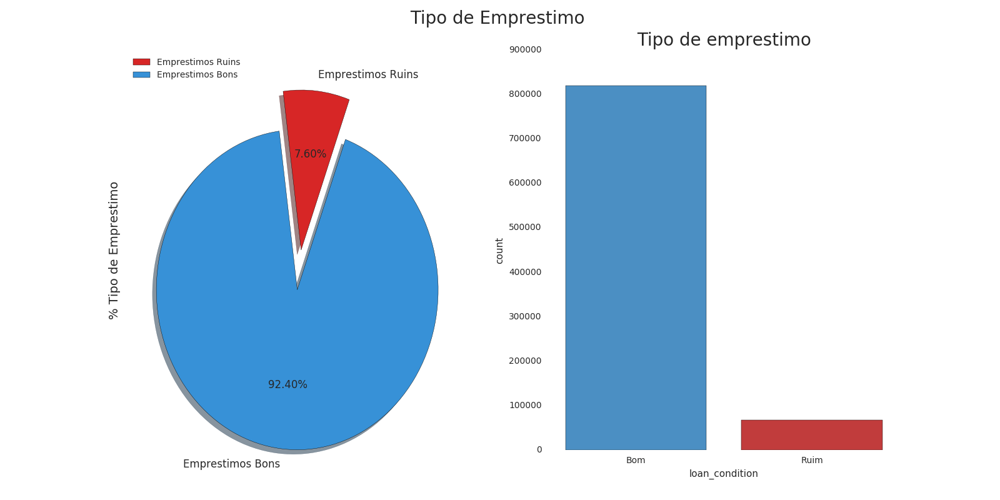

In [21]:
f, ax = plt.subplots(1,2, figsize=(16,8))

colors = ["#D72626","#3791D7"]
labels = "Emprestimos Ruins","Emprestimos Bons" 

plt.suptitle('Tipo de Emprestimo ', fontsize=20)
df_loan_cond = df.select("loan_condition").groupby("loan_condition").count().toPandas()
df_loan_cond = df_loan_cond.set_index('loan_condition').sort_index()
df_loan_cond.plot.pie(y="count",explode=[0,0.25], autopct='%1.2f%%', ax=ax[0], shadow=True, colors=colors, 
                                            labels=labels, fontsize=12, startangle=70)

ax[0].set_ylabel('% Tipo de Emprestimo', fontsize=14)
ax[0].legend(loc="upper left")

colors = ["#3791D7","#D72626"]
sns.countplot('loan_condition', data=df.select('loan_amnt','year','loan_condition').toPandas(), ax=ax[1], palette=colors)
ax[1].set_title('Tipo de emprestimo', fontsize=20)
ax[1].set_xticklabels(['Bom', 'Ruim'], rotation='horizontal')

display(f)

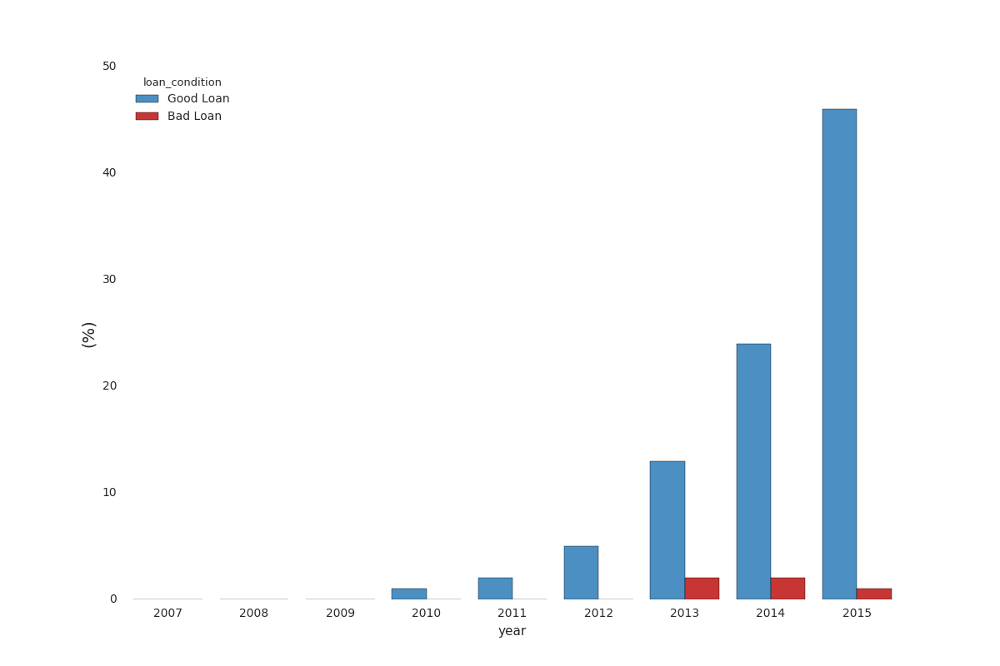

In [22]:
fig2 = plt.figure(figsize=(12,8))
palette = ["#3791D7", "#E01E1B"]

sns.barplot(x="year", y="loan_amnt", hue="loan_condition", data=df.select('loan_amnt','year','loan_condition').toPandas(), palette=palette, estimator=lambda x: (len(x)*100)/887379)
plt.ylabel("(%)", fontsize=14)

display(fig2)

In [23]:
# No gráfico acima, ao analisar a dispersão dos maus e bons emrpéstimos ao longo dos anos percebe-se que houve um acentuado aumento dos empréstimos aprovados nos ultimos anos, porém ao focar nos maus empréstimos, é possível ver um grande aumento em 2013 com queda em 2015. 

In [24]:
by_issued_amount = df.groupby(['issue_d', 'region']).sum('loan_amnt').withColumnRenamed("sum(loan_amnt)", "soma")

In [25]:
by_issued_amount.show(5)

+--------+---------+-----------+
 issue_d| region| soma|
+--------+---------+-----------+
Sep-2011| West| 6828825.0|
Aug-2011|SouthWest| 2174825.0|
Jun-2013|NorthEast| 3.349725E7|
Feb-2013|SouthWest| 1.40793E7|
Aug-2014|SouthEast|6.9899225E7|
+--------+---------+-----------+
only showing top 5 rows

In [26]:
df_dates = by_issued_amount.toPandas()
df_dates['complete_date'] = pd.to_datetime(df_dates['issue_d'])
df_dates['issue_d'] = [month.to_period('M') for 
                          month in df_dates['complete_date']]

df_dates['soma'] = df_dates['soma']/1000
df_dates = df_dates[['issue_d','region','soma']]


In [27]:
df_dates.groupby(['issue_d','region']).sum()['soma'].unstack().head()

Out[ 29 ]: 
region MidWest NorthEast SouthEast SouthWest West
issue_d 
2007-06 6.900 67.700 13.450 1.20 2.600
2007-07 46.725 133.150 140.950 NaN 27.500
2007-08 55.950 199.675 228.925 20.75 10.000
2007-09 39.800 201.050 86.000 18.05 28.050
2007-10 84.375 300.475 314.600 18.00 35.775

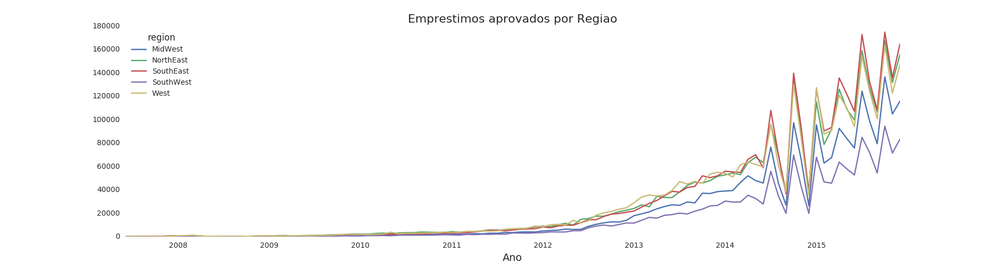

In [28]:
#fig = plt.figure(figsize=(6,6))
fig, ax = plt.subplots(figsize=(19,5))
df_dates.groupby(['issue_d','region']).sum()['soma'].unstack().plot(ax=ax)
plt.title('Emprestimos aprovados por Regiao', fontsize=16)
plt.xlabel('Ano', fontsize=14)
#plt.ylabel('Media de empréstimos', fontsize=14)
display(fig)


In [29]:
df.createOrReplaceTempView('loan_csv')

In [30]:
%sql select date_format(CAST(UNIX_TIMESTAMP(concat(cast('01-' as varchar(2)), cast(issue_d as varchar(4))), 'dd-MMM-yyyy') AS TIMESTAMP), 'yyyy-MM'
)  as issue_d, region, sum(loan_amnt) as soma from loan_csv group by 1,2 order by 1

issue_d,region,soma
2007-06,MidWest,6900.0
2007-06,NorthEast,67700.0
2007-06,SouthWest,1200.0
2007-06,SouthEast,13450.0
2007-06,West,2600.0
2007-07,SouthEast,140950.0
2007-07,NorthEast,133150.0
2007-07,MidWest,46725.0
2007-07,West,27500.0
2007-08,MidWest,55950.0


## Perspectivas do Negócio

### Entendendo o lado operacional do negócio

Agora, será realizada uma análise sobre o lado operacional do negócio por estado. Esta análise dará uma melhor idéia de em qual estado há uma atividade operacional maior. Assim, será possível responder perguntas como:

- Por que tal estado possui a maior atividade operacional?
- Seria esta causa devida à fatores econômicos?
- Ou então por conta do nível de risco ser baixo e os retornos serem razoavelmente decentes?

Para isso, as seguintes métricas serão avaliadas:

- soma total de empréstimos concedidos por estado;
- taxa de juros média cobrada para clientes em cada estado;
- e renda anual média dos clientes em cada estado.

Isto permitirá identificar os estados que dão altos retornos a um risco descente.

In [32]:
gdf = df.groupby(['region', 'addr_state'])
by_loan_amount = gdf.sum('loan_amnt')
metrics_df = pd.DataFrame()
metrics_df['state_codes'] = by_loan_amount.select('addr_state').toPandas()
metrics_df['issued_loans'] = by_loan_amount.select('sum(loan_amnt)').toPandas()
metrics_df['interest_rate'] = gdf.mean('int_rate').select('avg(int_rate)').toPandas()
metrics_df['annual_income'] = gdf.mean('annual_inc').select('avg(annual_inc)').toPandas()
metrics_df = metrics_df.round(decimals=2)
for column in metrics_df.columns:
  metrics_df[column] = metrics_df[column].astype(str)
metrics_df['text'] = metrics_df['state_codes'] + '<br>' + \
  'Average loan interest rate: ' + metrics_df['interest_rate'] + '<br>'+ \
  'Average annual income: ' + metrics_df['annual_income'] 
metrics_df.head()

Out[ 33 ]: 
 state_codes issued_loans interest_rate annual_income \
0 NE 17155050.0 12.96 63276.9 
1 RI 55052200.0 13.09 71315.64 
2 ME 8131825.0 12.46 64714.88 
3 NH 63555900.0 12.85 76917.71 
4 NM 73662975.0 13.33 71163.41 

 text 
0 NE<br>Average loan interest rate: 12.96<br>Ave... 
1 RI<br>Average loan interest rate: 13.09<br>Ave... 
2 ME<br>Average loan interest rate: 12.46<br>Ave... 
3 NH<br>Average loan interest rate: 12.85<br>Ave... 
4 NM<br>Average loan interest rate: 13.33<br>Ave...

In [33]:
scl = [[0.0, 'rgb(210, 241, 198)'], [0.2, 'rgb(188, 236, 169)'], [0.4, 'rgb(171, 235, 145)'], \
            [0.6, 'rgb(140, 227, 105)'], [0.8, 'rgb(105, 201, 67)'], [1.0, 'rgb(59, 159, 19)']]
data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = metrics_df['state_codes'],
        z = metrics_df['issued_loans'], 
        locationmode = 'USA-states',
        text = metrics_df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "$s USD")
        ) ]
layout = dict(
    title = 'Lending Clubs Emprestimos Aprovados <br> (Uma perspectiva para operacoes de negócio)',
    geo = dict(
        scope = 'usa',
        projection=dict(type='albers usa'),
        showlakes = True,
        lakecolor = 'rgb(255, 255, 255)')
)
fig = dict(data=data, layout=layout)
displayHTML(plot(fig, filename='d3-cloropleth-map', output_type='div'))

Pela figura acima, verifica-se que **Califórnia (CA)**, **Texas (TX)**, **Nova York (NY)** e **Flórida (FL)** são os estados que tiveram maior número de empréstimos concedidos. Estes mesmos estados possuem uma taxa de juros média aproximadamente igual à 13%. Por fim, a renda anual média dos clientes dos estados **Califórnia (CA)**, **Texas (TX)** e **Nova York (NY)** se encontram acima da média de todos os estados. Apenas o estado da Flórida é uma exceção à esta última situação.

In [35]:
from pyspark.sql import functions as f
bad_loan_df = df.filter(df.loan_condition == "Bad Loan")
loan_status_cross = bad_loan_df.crosstab('region','loan_status')
loan_status_cross = loan_status_cross.withColumnRenamed('Does not meet the credit policy. Status:Charged Off', 'Does_not_meet_policy' )

df_count = loan_status_cross.groupBy().sum("Charged Off","Default", "Does_not_meet_policy","In Grace Period","Late (16-30 days)","Late (31-120 days)")

from pyspark.sql.types import FloatType

x = df_count.collect()
k=0 
loan_status_cross_porcent = loan_status_cross
for col_name in ["Charged Off","Default", "Does_not_meet_policy","In Grace Period","Late (16-30 days)","Late (31-120 days)"]:
  n = x[0][k]
  loan_status_cross_porcent = loan_status_cross_porcent.withColumn(col_name, (100*loan_status_cross[col_name]/n))
  loan_status_cross_porcent = loan_status_cross_porcent.withColumn(col_name, spf.round(col_name, 2))
  k = k + 1
loan_status_cross_porcent_pd = loan_status_cross_porcent.toPandas()

In [36]:
loan_status_cross = loan_status_cross.withColumn('total', f.col("Charged Off")+f.col("Default")+f.col("Does_not_meet_policy")+f.col("In Grace Period")+f.col("Late (16-30 days)")+f.col("Late (31-120 days)"))
for col_name in ["Charged Off","Default", "Does_not_meet_policy","In Grace Period","Late (16-30 days)","Late (31-120 days)"]:
  loan_status_cross = loan_status_cross.withColumn(col_name, (100*loan_status_cross[col_name]/loan_status_cross["total"]))
  loan_status_cross = loan_status_cross.withColumn(col_name, spf.round(col_name, 2))
  

In [37]:
loan_status_cross_pd = loan_status_cross.toPandas()
charged_off = loan_status_cross_pd['Charged Off'].values.tolist()
default = loan_status_cross_pd['Default'].values.tolist()
not_meet_credit = loan_status_cross_pd['Does_not_meet_policy'].values.tolist()
grace_period = loan_status_cross_pd['In Grace Period'].values.tolist()
short_pay = loan_status_cross_pd['Late (16-30 days)'] .values.tolist()
long_pay = loan_status_cross_pd['Late (31-120 days)'].values.tolist()

In [38]:
charged = go.Bar(
    x=['NorthEast', 'SouthEast', 'SouthWest','MidWest', 'West'],
    y= charged_off,
    name='Charged Off',
    marker=dict(
        color='rgb(192, 148, 246)'
    ),
    text = '%'
)
defaults = go.Bar(
    x=['NorthEast', 'SouthEast', 'SouthWest','MidWest', 'West'],
    y= default,
    name='Defaults',
    marker=dict(
        color='rgb(176, 26, 26)'
    ),
    text = '%'
)

credit_policy = go.Bar(
    x=['NorthEast', 'SouthEast', 'SouthWest','MidWest', 'West'],
    y= not_meet_credit,
    name='Does not meet Credit Policy',
    marker = dict(
        color='rgb(229, 121, 36)'
    ),
    text = '%'
)
grace = go.Bar(
    x=['NorthEast', 'SouthEast', 'SouthWest','MidWest', 'West'],
    y= grace_period,
    name='Grace Period',
    marker = dict(
        color='rgb(147, 147, 147)'
    ),
    text = '%'
)

short_pays = go.Bar(
    x=['NorthEast', 'SouthEast', 'SouthWest','MidWest', 'West'],
    y= short_pay,
    name='Late Payment (16-30 days)', 
    marker = dict(
        color='rgb(246, 157, 135)'
    ),
    text = '%'
)
long_pays = go.Bar(
    x=['NorthEast', 'SouthEast', 'SouthWest','MidWest', 'West'],
    y= long_pay,
    name='Late Payment (31-120 days)',
    marker = dict(
        color = 'rgb(238, 76, 73)'
        ),
    text = '%'
)

data = [charged, defaults, credit_policy, grace, short_pays, long_pays]
layout = go.Layout(
    barmode='stack',
    title = '% de Empréstimo Ruim por Região',
    xaxis=dict(title='Regiões dos EUA')
)

figuras1 = go.Figure(data=data, layout=layout)
displayHTML(plot(figuras1, filename='stacked-bar', output_type='div'))

In [39]:
#Do gráfico tiramos que a proporção dos tipos de maus empréstimos é mantida praticamente igual independentemente da região

In [40]:
charged_off1 = loan_status_cross_porcent_pd['Charged Off'].values.tolist()
default1 = loan_status_cross_porcent_pd['Default'].values.tolist()
not_meet_credit1 = loan_status_cross_porcent_pd['Does_not_meet_policy'].values.tolist()
grace_period1 = loan_status_cross_porcent_pd['In Grace Period'].values.tolist()
short_pay1 = loan_status_cross_porcent_pd['Late (16-30 days)'] .values.tolist()
long_pay1 = loan_status_cross_porcent_pd['Late (31-120 days)'].values.tolist()

In [41]:
charged = go.Bar(
    x=['NorthEast', 'SouthEast', 'SouthWest','MidWest', 'West'],
    y= charged_off1,
    name='Charged Off',
    marker=dict(
        color='rgb(192, 148, 246)'
    ),
    text = '%'
)
defaults = go.Bar(
    x=['NorthEast', 'SouthEast', 'SouthWest','MidWest', 'West'],
    y= default1,
    name='Defaults',
    marker=dict(
        color='rgb(176, 26, 26)'
    ),
    text = '%'
)

credit_policy = go.Bar(
    x=['NorthEast', 'SouthEast', 'SouthWest','MidWest', 'West'],
    y= not_meet_credit1,
    name='Does not meet Credit Policy',
    marker = dict(
        color='rgb(229, 121, 36)'
    ),
    text = '%'
)
grace = go.Bar(
    x=['NorthEast', 'SouthEast', 'SouthWest','MidWest', 'West'],
    y= grace_period1,
    name='Grace Period',
    marker = dict(
        color='rgb(147, 147, 147)'
    ),
    text = '%'
)

short_pays = go.Bar(
    x=['NorthEast', 'SouthEast', 'SouthWest','MidWest', 'West'],
    y= short_pay1,
    name='Late Payment (16-30 days)', 
    marker = dict(
        color='rgb(246, 157, 135)'
    ),
    text = '%'
)
long_pays = go.Bar(
    x=['NorthEast', 'SouthEast', 'SouthWest','MidWest', 'West'],
    y= long_pay1,
    name='Late Payment (31-120 days)',
    marker = dict(
        color = 'rgb(238, 76, 73)'
        ),
    text = '%'
)

data = [charged, defaults, credit_policy, grace, short_pays, long_pays]
layout = go.Layout(
    barmode='stack',
    title = '% de Emprestimo Ruim por Regiao',
    xaxis=dict(title='Regioes dos EUA')
)

figuras2 = go.Figure(data=data, layout=layout)
displayHTML(plot(figuras2, filename='stacked-bar', output_type='div'))

## Avaliação de Risco

### Entendendo o lado arriscado do negócio

Além do lado operacional do negócio, é importante analizar o nível de risco tomado em cada estado. O *score* de crédito é uma métrica importante para a análise do nível de risco para um cliente individual. Contudo, também há outras métricas importantes para tentar estimar o nível de risco de outros estados. Entre elas estão as seguintes métricas:

- **débito-à-dívida**: diz qual é o nível de débito de um cliente individual com respeito à sua renda total;
- **duração média de emprego**: descreve sobre o mercado de trabalho em cada estado (o que está diretamente relacionado com o nível de risco).

Estas métricas serão levantas a seguir para cada estado.

In [43]:
condition_bystate_df = df.crosstab('addr_state', 'loan_condition')
condition_bystate_df = condition_bystate_df.withColumn('total', f.col('Bad Loan')+f.col('Good Loan'))
condition_bystate_df = condition_bystate_df.withColumn('bad_relative', f.round(100 * f.col('Bad Loan') / f.col('total'), 3))
condition_bystate_df = condition_bystate_df.withColumn('good_relative', f.round(100 * f.col('Good Loan') / f.col('total'), 3))
condition_bystate_df = condition_bystate_df.withColumn('ratio', f.round(f.col('Bad Loan') / f.col('Good Loan'), 3))
display(condition_bystate_df)

risk_df = pd.DataFrame()
risk_df['state_codes'] = condition_bystate_df.select('addr_state_loan_condition').toPandas()
risk_df['default_ratio'] = condition_bystate_df.select('ratio').toPandas()
risk_df['badloans_amount'] = condition_bystate_df.select('Bad Loan').toPandas()
risk_df['percentage_of_badloans'] = condition_bystate_df.select('bad_relative').toPandas()
risk_df['average_dti'] = gdf.mean('dti').select('avg(dti)').toPandas()
risk_df['average_emp_length'] = gdf.mean('emp_length_int').select('avg(emp_length_int)').toPandas()
risk_df.head()

addr_state_loan_condition,Bad Loan,Good Loan,total,bad_relative,good_relative,ratio
MA,1523,19070,20593,7.396,92.604,0.08
IN,961,12828,13789,6.969,93.031,0.075
ID,1,11,12,8.333,91.667,0.091
NM,402,4537,4939,8.139,91.861,0.089
OR,776,10117,10893,7.124,92.876,0.077
IA,3,11,14,21.429,78.571,0.273
IL,2258,33218,35476,6.365,93.635,0.068
TN,923,11964,12887,7.162,92.838,0.077
MO,1084,13123,14207,7.63,92.37,0.083
ME,1,524,525,0.19,99.81,0.002


In [44]:
for col in risk_df.columns:
    risk_df[col] = risk_df[col].astype(str)
    
scl = [[0.0, 'rgb(202, 202, 202)'],[0.2, 'rgb(253, 205, 200)'],[0.4, 'rgb(252, 169, 161)'],\
            [0.6, 'rgb(247, 121, 108  )'],[0.8, 'rgb(232, 70, 54)'],[1.0, 'rgb(212, 31, 13)']]

risk_df['text'] = risk_df['state_codes'] + '<br>' +\
'Number of Bad Loans: ' + risk_df['badloans_amount'] + '<br>' + \
'Percentage of all Bad Loans: ' + risk_df['percentage_of_badloans'] + '%' +  '<br>' + \
'Average Debt-to-Income Ratio: ' + risk_df['average_dti'] + '<br>'+\
'Average Length of Employment: ' + risk_df['average_emp_length'] 

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = risk_df['state_codes'],
        z = risk_df['default_ratio'], 
        locationmode = 'USA-states',
        text = risk_df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "%")
        ) ]

layout = dict(
    title = 'Lending Clubs Niveis de Inadimplencia <br> (Analise de Risco)',
    geo = dict(
        scope = 'usa',
        projection=dict(type='albers usa'),
        showlakes = True,
        lakecolor = 'rgb(255, 255, 255)')
)

fig = dict(data=data, layout=layout)
displayHTML(plot(fig, filename='d3-cloropleth-map', output_type='div'))

A partir da figura acima, é possível fazer as seguintes verificações:

- o estado de **Iowa (IA)** tem o maior nível de proporção padrão; no entanto, a quantidade de empréstimos concedidos neste estado é bem baixa, pois o número de empréstimos ruins neste estado é igual à três.
- os estados **Califórnia (CA)** e **Texas (TX)** parecem ter os menores riscos e as maiores chances de retorno para o investidor.

In [46]:
features_oscar = ['loan_amnt','funded_amnt','funded_amnt_inv','int_rate','installment','annual_inc','dti','delinq_2yrs','inq_last_6mths','open_acc','pub_rec','revol_bal','revol_util','total_acc','out_prncp','out_prncp_inv','total_pymnt','total_pymnt_inv','total_rec_prncp','total_rec_int','total_rec_late_fee','recoveries','collection_recovery_fee','last_pymnt_amnt','collections_12_mths_ex_med','policy_code','acc_now_delinq']

features_oscar = ['loan_amnt','funded_amnt','funded_amnt_inv','int_rate','installment','revol_bal','out_prncp','out_prncp_inv','total_pymnt','total_pymnt_inv','total_rec_prncp','total_rec_int','recoveries','collection_recovery_fee','last_pymnt_amnt']

features_oscar1 = ['loan_amnt','funded_amnt','funded_amnt_inv']
df_oscar = df[features_oscar]
display(df_oscar)

loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,revol_bal,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,recoveries,collection_recovery_fee,last_pymnt_amnt
5000.0,5000.0,4975.0,10.65,162.87,13648.0,0.0,0.0,5861.07141425,5831.78,5000.0,861.07,0.0,0.0,171.62
2500.0,2500.0,2500.0,15.27,59.83,1687.0,0.0,0.0,1008.71,1008.71,456.46,435.17,117.08,1.11,119.66
2400.0,2400.0,2400.0,15.96,84.33,2956.0,0.0,0.0,3003.65364445,3003.65,2400.0,603.65,0.0,0.0,649.91
10000.0,10000.0,10000.0,13.49,339.31,5598.0,0.0,0.0,12226.3022123,12226.3,10000.0,2209.33,0.0,0.0,357.48
3000.0,3000.0,3000.0,12.69,67.79,27783.0,766.9,766.9,3242.17,3242.17,2233.1,1009.07,0.0,0.0,67.79
5000.0,5000.0,5000.0,7.9,156.46,7963.0,0.0,0.0,5631.37775318,5631.38,5000.0,631.38,0.0,0.0,161.03
7000.0,7000.0,7000.0,15.96,170.08,17726.0,1889.15,1889.15,8136.84,8136.84,5110.85,3025.99,0.0,0.0,170.08
3000.0,3000.0,3000.0,18.64,109.43,8221.0,0.0,0.0,3938.14433376,3938.14,3000.0,938.14,0.0,0.0,111.34
5600.0,5600.0,5600.0,21.28,152.39,5210.0,0.0,0.0,646.02,646.02,162.02,294.94,189.06,2.09,152.39
5375.0,5375.0,5350.0,12.69,121.45,9279.0,0.0,0.0,1476.19,1469.34,673.48,533.42,269.29,2.52,121.45


In [47]:
from pyspark.mllib.stat import Statistics

features_O = df_oscar.rdd.map(lambda row: row[0:])
corr_mat=Statistics.corr(features_O, method="pearson")


In [48]:
display(df['loan_condition','purpose'].groupby("purpose").count())

purpose,count
wedding,2347
educational,423
other,42894
small_business,10377
debt_consolidation,524215
credit_card,206182
moving,5414
vacation,4736
renewable_energy,575
house,3707


In [49]:
df_cross = df.crosstab('purpose','loan_condition')

In [50]:
display(df_cross)

purpose_loan_condition,Bad Loan,Good Loan
major_purchase,1294,15983
debt_consolidation,41608,482607
credit_card,11755,194427
home_improvement,3553,48276
renewable_energy,72,503
small_business,1781,8596
moving,607,4807
car,596,8267
vacation,402,4334
educational,88,335


In [51]:
df_cross = df_cross.withColumn('total', spf.col("Bad Loan")+spf.col("Good Loan") )
df_cross = df_cross.withColumn('Bad_perc', spf.round(100*spf.col("Bad Loan")/spf.col("total"), 2) )
df_cross = df_cross.withColumn('Good_perc', spf.round(100*spf.col("Good Loan")/spf.col("total"), 2) )

display(df_cross)

purpose_loan_condition,Bad Loan,Good Loan,total,Bad_perc,Good_perc
major_purchase,1294,15983,17277,7.49,92.51
debt_consolidation,41608,482607,524215,7.94,92.06
credit_card,11755,194427,206182,5.7,94.3
home_improvement,3553,48276,51829,6.86,93.14
renewable_energy,72,503,575,12.52,87.48
small_business,1781,8596,10377,17.16,82.84
moving,607,4807,5414,11.21,88.79
car,596,8267,8863,6.72,93.28
vacation,402,4334,4736,8.49,91.51
educational,88,335,423,20.8,79.2


In [52]:
purpose_bad_loans_t = df_cross_p["Bad Loan"].values.tolist()
purpose_bad_loans = df_cross_p["Bad_perc"].values.tolist()
purpose_good_loans_t = df_cross_p["Good Loan"].values.tolist()
purpose_good_loans = df_cross_p["Good_perc"].values.tolist()
purpose = df_cross_p['purpose_loan_condition'].tolist()


bad_plot = go.Bar(
    x=purpose,
    y=purpose_bad_loans,
    name = 'Empréstimo Ruim',
    textposition = 'outside',
    marker=dict(
        color='rgba(215, 38, 38, 1)',
        line = dict(
            color='rgba(215, 38, 38, 1)',
            width=2
        )
    )
)

good_plot = go.Bar(
    x=purpose,
    y=purpose_good_loans,
    name='Empréstimo Bom',
    textposition = 'auto',
    marker=dict(
        color='rgba(55, 145, 215, 1)',
        line = dict(
            color='rgba(55, 145, 215, 1)',
            width=2
        )
    )
)


data = [bad_plot, good_plot]

layout = go.Layout(
    title='Condição de Empréstimo por Finalidade',
    xaxis=dict(
        title=''
    ),
    yaxis=dict(
        title='% Porcentagem de Empréstimo',
    ),
    showlegend=True
)

fig = dict(data=data, layout=layout)
displayHTML(plot(fig, filename='condition_purposes', output_type='div'))


In [53]:
temp_table_name = "loan_csv"
df.createOrReplaceTempView(temp_table_name)

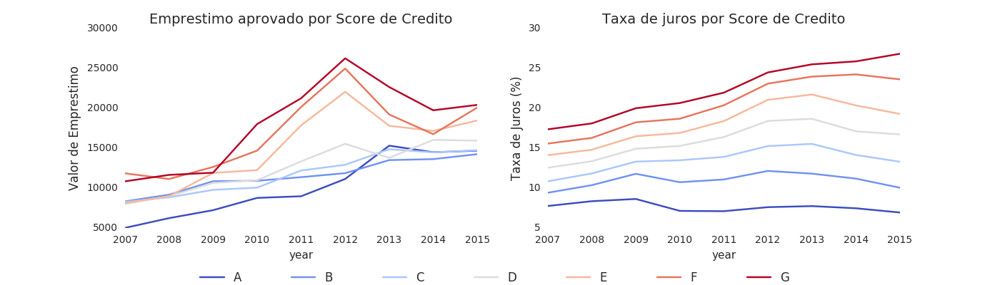

In [54]:
split_col = split(df['issue_d'], '-')
df = df.withColumn('month', split_col.getItem(0))
df = df.withColumn('year', split_col.getItem(1).cast("int"))
f, ((ax1, ax2)) = plt.subplots(1, 2)

cmap = plt.cm.coolwarm

by_credit_score.groupby(['year','grade']).sum()['avg(loan_amnt)'].unstack().plot(legend=False, ax=ax1, figsize=(14, 4), colormap=cmap)
ax1.set_title('Emprestimo aprovado por Score de Credito', fontsize=14)
ax1.set(xticklabels=['2007','2008','2009','2010','2011','2012','2013','2014','2015'])
ax1.set_ylabel('Valor de Emprestimo', fontsize=12)
    
by_inc.groupby(['year','grade']).sum()['avg(int_rate)'].unstack().plot(ax=ax2, figsize=(14, 4), colormap=cmap)
ax2.set_title('Taxa de juros por Score de Credito', fontsize=14)
ax2.set(xticklabels=['2007','2008','2009','2010','2011','2012','2013','2014','2015'])
plt.legend(bbox_to_anchor=(-1.0, -0.3, 1.7, 0.1), loc=5, prop={'size':12},
           ncol=7, mode="expand", borderaxespad=0.)
ax2.set_ylabel('Taxa de Juros (%)', fontsize=12)

plt.subplots_adjust(bottom=0.2)
display(f)

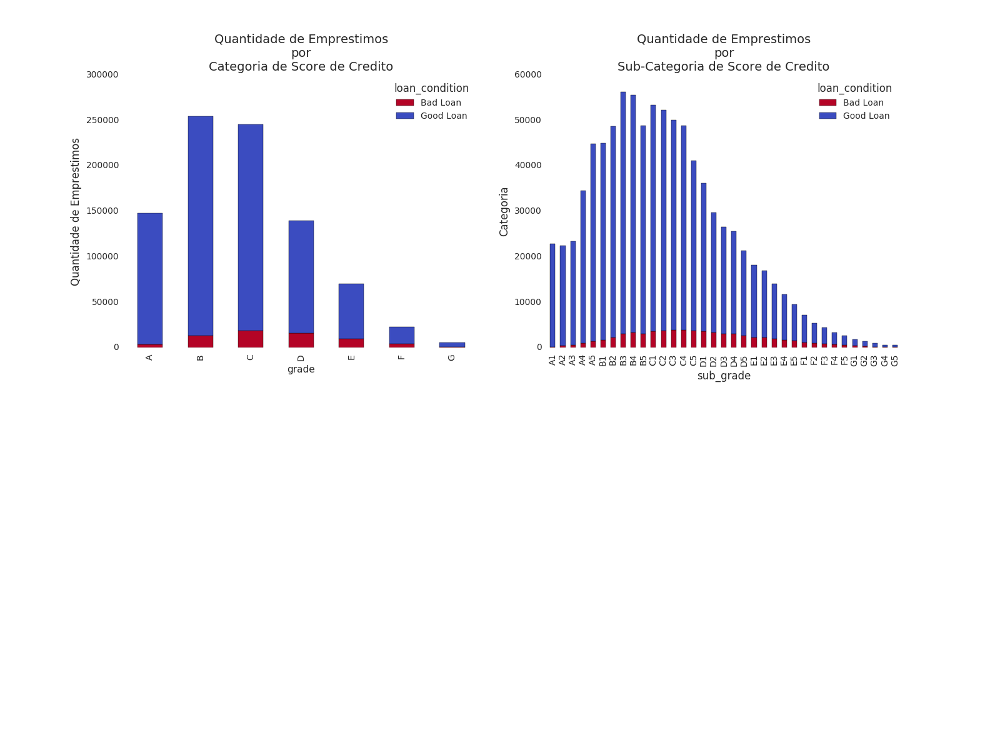

In [55]:
fig = plt.figure(figsize=(16,12))

ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)

cmap = plt.cm.coolwarm_r

loans_by_region = df.groupBy('grade', 'loan_condition').count().toPandas()
print(loans_by_region.groupby(['grade','loan_condition']).sum()['count'].unstack())
loans_by_region.groupby(['grade','loan_condition']).sum()['count'].unstack().plot(kind='bar', stacked=True, colormap=cmap, ax=ax1, grid=False)
ax1.set_title('Quantidade de Emprestimos\npor\nCategoria de Score de Credito', fontsize=14)
ax1.set_ylabel('Quantidade de Emprestimos', fontsize=12)
ax2.set_xlabel('Categoria', fontsize=12)

loans_by_grade = df.groupBy('sub_grade', 'loan_condition').count().toPandas()
loans_by_grade.groupby(['sub_grade','loan_condition']).sum()['count'].unstack().plot(kind='bar', stacked=True, colormap=cmap, ax=ax2, grid=False)
ax2.set_title('Quantidade de Emprestimos\npor\nSub-Categoria de Score de Credito', fontsize=14)
ax2.set_ylabel('Quantidade de Emprestimos', fontsize=12)
ax2.set_ylabel('Categoria', fontsize=12)
display(fig)